<a href="https://colab.research.google.com/github/alond-ra/probabilistic-roadmap-algorithm/blob/main/Probabilistic_Roadmap.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [30]:
import numpy as np
import random
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon
import networkx as nx
from scipy.spatial import KDTree
import heapq
from scipy.spatial import Voronoi, voronoi_plot_2d
import pickle
from google.colab import files

from utils import collision_free
from utils import plot_PRM
from utils import initialize_samples
from utils import calculate_triangle_area
from utils import plot_halton_voronoi
from utils import plot_hammersley_voronoi
from utils import radical_inverse
from utils import filter_samples


In [3]:
MAX_SAMPLES = 1000

#### Problema de planificación


In [4]:
# Espacio de configuraciones: (0,10)^2
x_lim = (0, 10)
y_lim = (0, 10)

# triángulos [(2,2), (5,5), (4,1)], [(8,8), (7,5), (9,4)],  [(7,2), (8,1), (6,2)], [(2,8), (4,6), (6,8)]$
obstacles = [
    ([2, 5, 4],
     [2, 5, 1]),
    ([8, 7, 9],
     [8, 5, 4]),
    ([7, 8, 6],
     [2, 1, 2]),
    ([2, 4, 6],
     [8, 6, 8]),
]

# configuracion inicial
start = np.array([8.1, 9.2])

# configuración final
goal = np.array([1.5, 0.99])

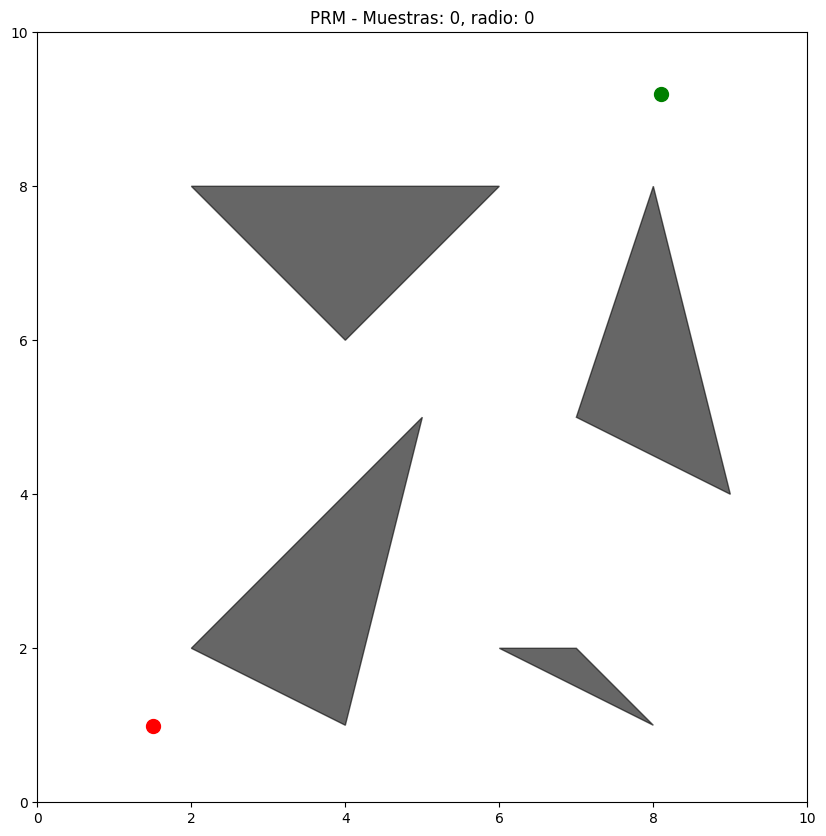

In [5]:
plot_PRM([],[], 0, obstacles, x_lim, y_lim, start, goal)

#### PRM

In [84]:
class PRM:
    def __init__(self):
        self.V = []
        self.E = []
        self.radio = 0

    def __init__(self, muestras, obstaculos, radio):
        self.V = muestras
        self.E = []
        self.radio = radio

        kdtree = KDTree(self.V)
        for i, v in enumerate(self.V):
            neighbors = kdtree.query_ball_point(v, self.radio)
            for u_idx in neighbors:
                if u_idx != i:
                    u = self.V[u_idx]
                    if collision_free(v, u, obstaculos):
                        self.E.append((i, u_idx))

    def get_PRM(self):
        return self.V, self.E, self.radio

    def plot_original_PRM(self):
        plot_PRM(self.V, self.E, self.radio, obstacles, x_lim, y_lim)

    def add_query_points(self, start, goal):
        self.qV = self.V.copy()
        self.qE = self.E.copy()
        kdtree = KDTree(self.qV)

        self.qV.append(start)
        start_idx = len(self.qV) - 1
        self.qV.append(goal)
        goal_idx = len(self.qV) - 1

        start_neighbors = kdtree.query_ball_point(start, self.radio)
        for u_idx in start_neighbors:
            if collision_free(start, self.qV[u_idx], obstacles):
                self.qE.append((start_idx, u_idx))

        goal_neighbors = kdtree.query_ball_point(goal, self.radio)
        for u_idx in goal_neighbors:
            if collision_free(goal, self.V[u_idx], obstacles):
                self.qE.append((goal_idx, u_idx))

        return self.qV, self.qE, start_idx, goal_idx

    def find_shortest_path(self,start, goal):
        #_ , _ , start_idx, goal_idx = self.add_query_points(start, goal)
        #print("start_idx: ", start_idx)
        #print("goal_idx: ", goal_idx)
        G = nx.Graph()
        for i, j in self.qE:
            G.add_edge(i, j, weight=np.linalg.norm(np.array(self.qV[i]) - np.array(self.qV[j])))
        try:
            path = nx.shortest_path(G, source=start_idx, target=goal_idx, weight='weight')
            return [self.qV[i] for i in path]
        except nx.NetworkXNoPath:
            return None

    def min_path_cost(self,start, goal):
        path = self.find_shortest_path(start,goal)
        return sum(np.linalg.norm(np.array(path[i]) - np.array(path[i+1])) for i in range(len(path)-1))

    def plot_query_PRM(self, x_init, x_goal, path=None):
        path = self.find_shortest_path(x_init, x_goal)
        plot_PRM(self.qV, self.qE, self.radio ,obstacles, x_lim, y_lim, start, goal, path)
        print("Costo del camino: ", self.min_path_cost(x_init, x_goal))
        print("x_init = ", x_init)
        print("x_goal = ", x_goal)

    def summary(self):
        print("PRM ---------------------------------------------------------------")
        print("Cantidad de muestras: ", len(self.V))
        print("Cantidad de aristas: ", len(self.E))
        print("Radio de conexión: ", self.radio)
        print("Longitud del camino más corto:", self.min_path_cost(start, goal))
        print("-------------------------------------------------------------------")

In [7]:
samples = []
descartadas = [] # contiene las aceptadas Y las descartas
initialize_samples(samples,descartadas, x_lim, y_lim, obstacles, MAX_SAMPLES)

In [8]:
radio = 2
prm_instance = PRM(samples[:200], obstacles, radio)

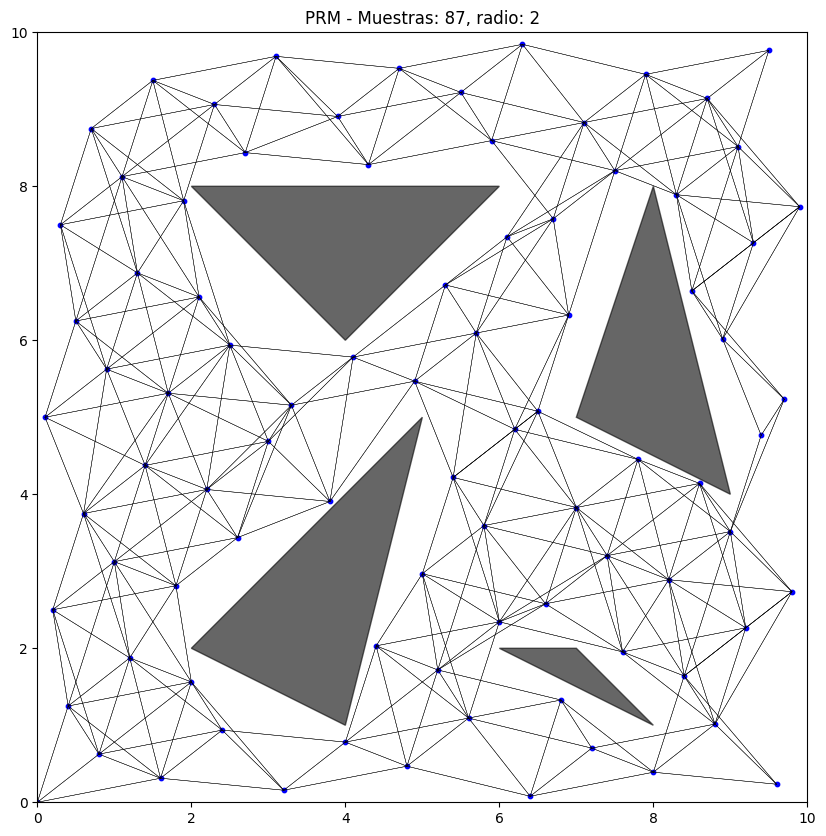

[8.1 9.2]


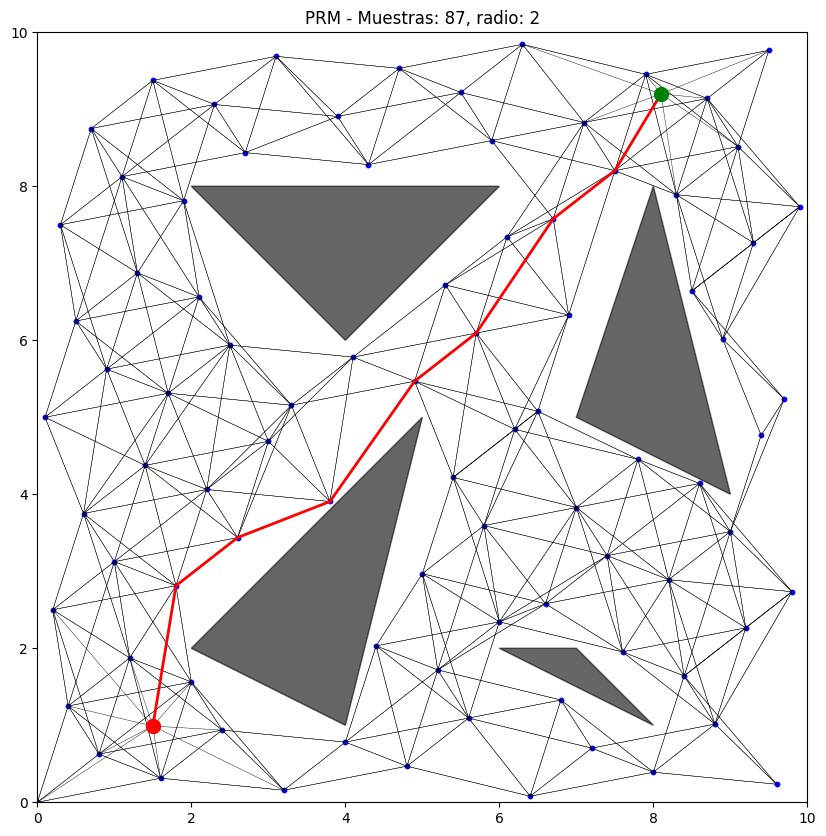

Costo del camino:  11.045094132494999
PRM ---------------------------------------------------------------
Cantidad de muestras:  87
Cantidad de aristas:  628
Radio de conexión:  2
Longitud del camino más corto: 11.045094132494999
-------------------------------------------------------------------


In [45]:
prm_instance.plot_original_PRM()
print(start)
qV, qE, start_idx, goal_idx = prm_instance.add_query_points(start, goal)

shortest_path = prm_instance.find_shortest_path(start, goal)
path_cost = prm_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_instance.plot_query_PRM(start, goal)

prm_instance.summary()

In [10]:
radio = 2
prm_instance = PRM(samples[:500], obstacles, radio)

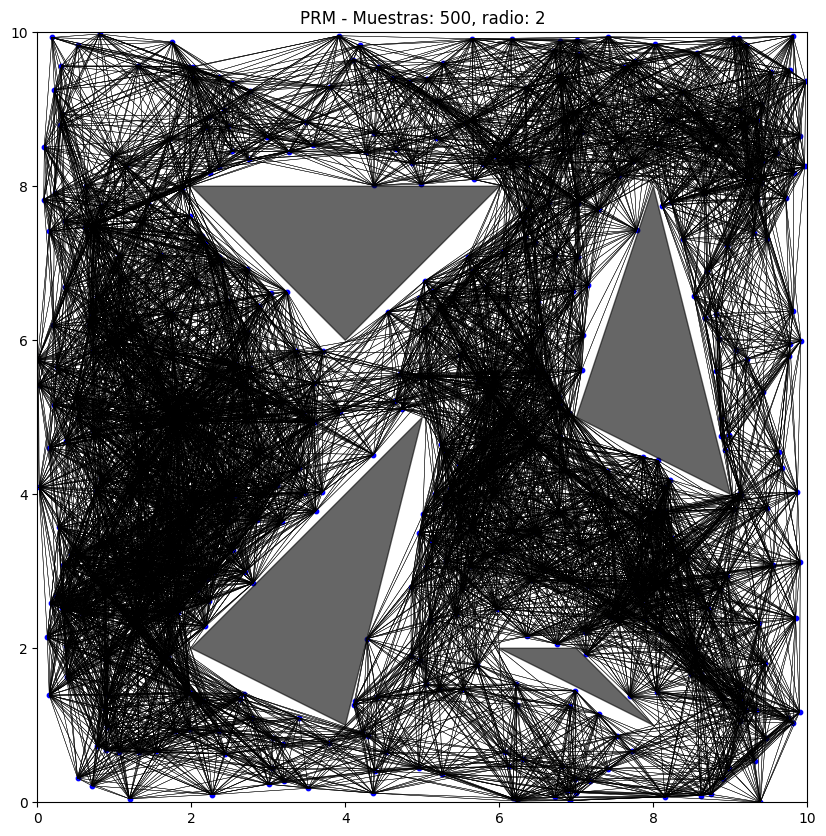

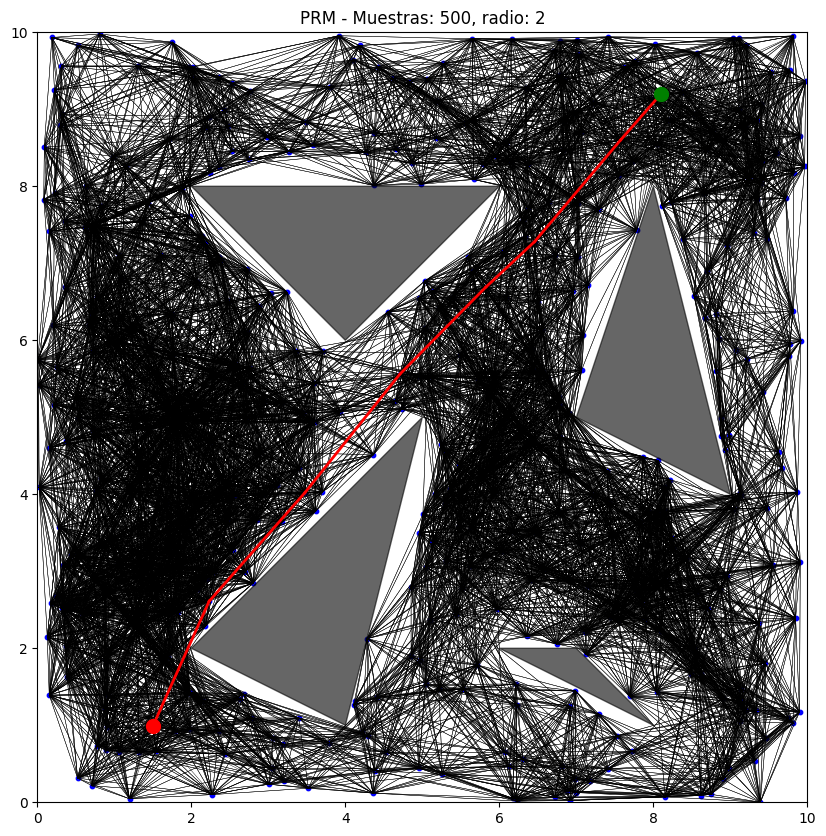

Costo del camino:  10.611018280653896
PRM ---------------------------------------------------------------
Cantidad de muestras:  500
Cantidad de aristas:  23674
Radio de conexión:  2
Longitud del camino más corto: 10.611018280653896
-------------------------------------------------------------------


In [11]:
prm_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_instance.add_query_points(start, goal)

shortest_path = prm_instance.find_shortest_path(start, goal)
path_cost = prm_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_instance.plot_query_PRM(start, goal)

prm_instance.summary()

####PRM*

In [12]:
class PRM_star(PRM):
    def __init__(self, muestras, obstaculos):
        def gamma_PRM(x_lim, y_lim, obstacles):
            d = 2
            total_area = (x_lim[1] - x_lim[0]) * (y_lim[1] - y_lim[0])

            obstacle_area = 0
            for obstacle in obstacles:
                x = obstacle[0]
                y = obstacle[1]
                vertices = list(zip(x, y))
                obstacle_area += calculate_triangle_area(vertices)

            free_area = total_area - obstacle_area
            zeta_d = np.pi

            gamma_PRM = 2 * (1 + 1/d)**(1/d) * (free_area / zeta_d)**(1/d)

            return gamma_PRM

        def optmized_radius(n_samples=-1):
            epsilon = 1/1000
            gamma_prm = gamma_PRM(x_lim, y_lim, obstacles)

            r = gamma_prm * (np.log(n_samples) / n_samples) ** (1/2) + epsilon
            return r

        super().__init__(muestras, obstaculos, optmized_radius(len(muestras)))

    def summary(self):
        print("PRM* ---------------------------------------------------------------")
        print("Cantidad de muestras: ", len(self.V))
        print("Cantidad de aristas: ", len(self.E))
        print("Radio de conexión: ", self.radio)
        print("Longitud del camino más corto:", self.min_path_cost(start, goal))

In [13]:
prm_star_instance = PRM_star(samples[:200], obstacles)

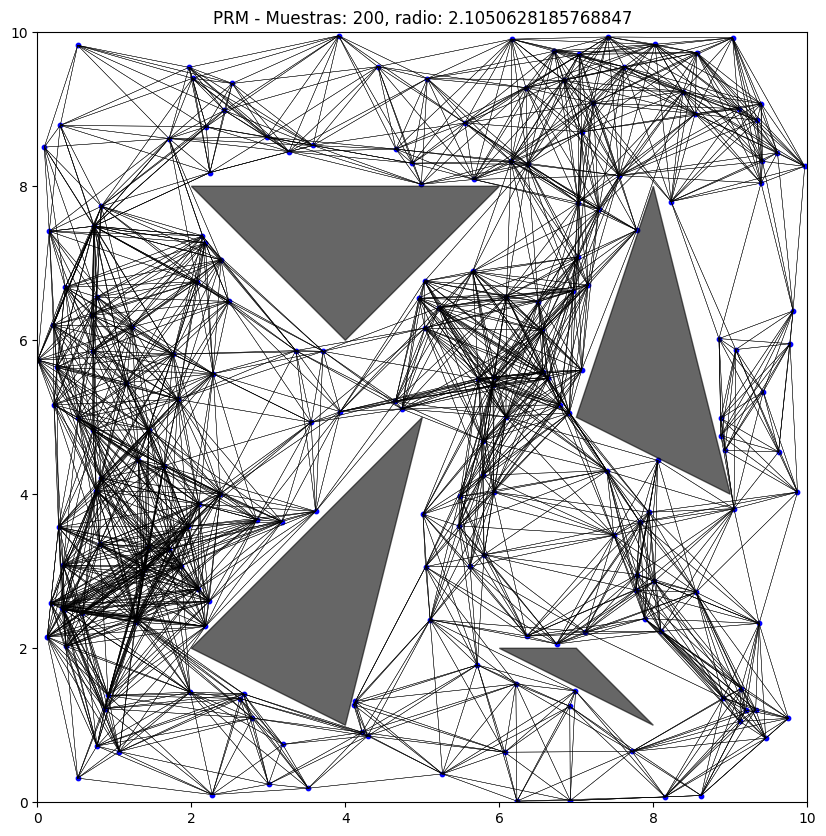

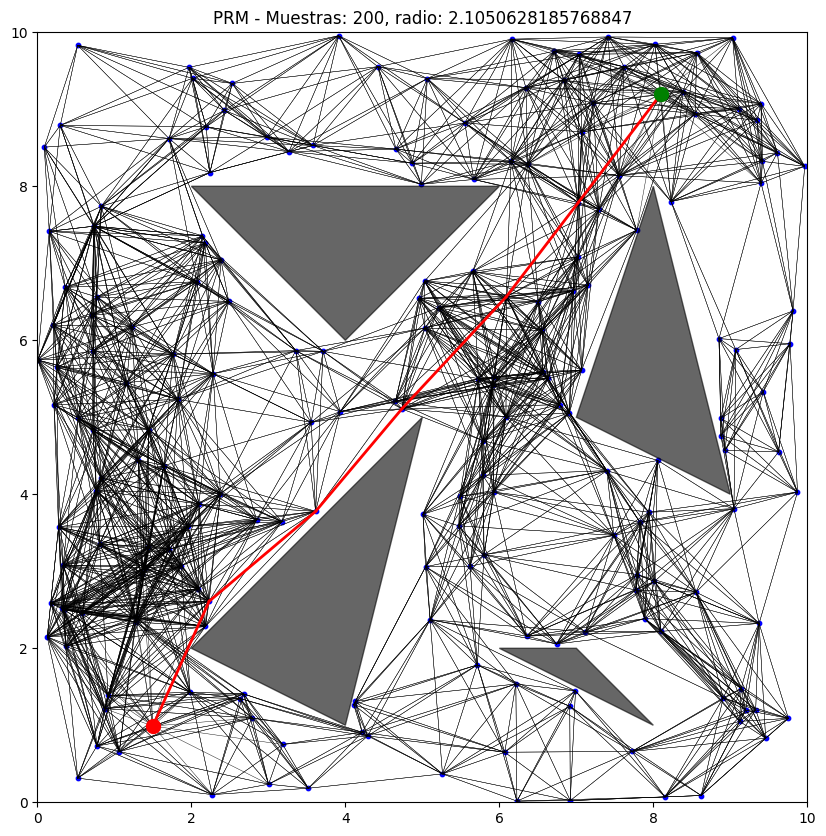

Costo del camino:  10.630833915452683
PRM* ---------------------------------------------------------------
Cantidad de muestras:  200
Cantidad de aristas:  3964
Radio de conexión:  2.1050628185768847
Longitud del camino más corto: 10.630833915452683


In [14]:
prm_star_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_star_instance.add_query_points(start, goal)

shortest_path = prm_star_instance.find_shortest_path(start, goal)
path_cost = prm_star_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_star_instance.plot_query_PRM(start, goal)

prm_star_instance.summary()

In [15]:
prm_star_instance = PRM_star(samples[:500], obstacles)

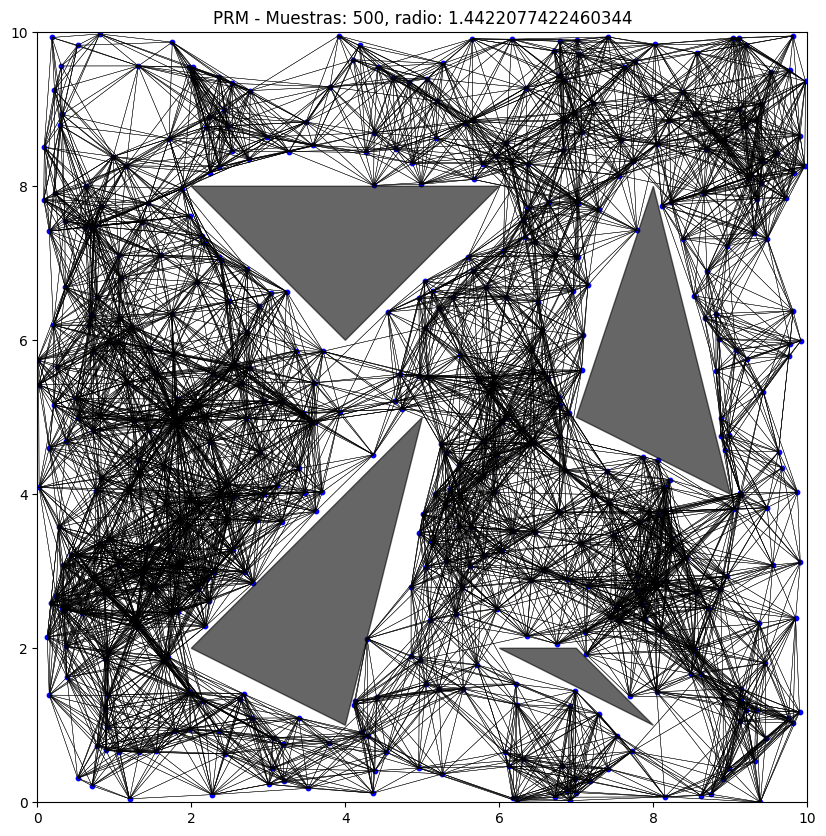

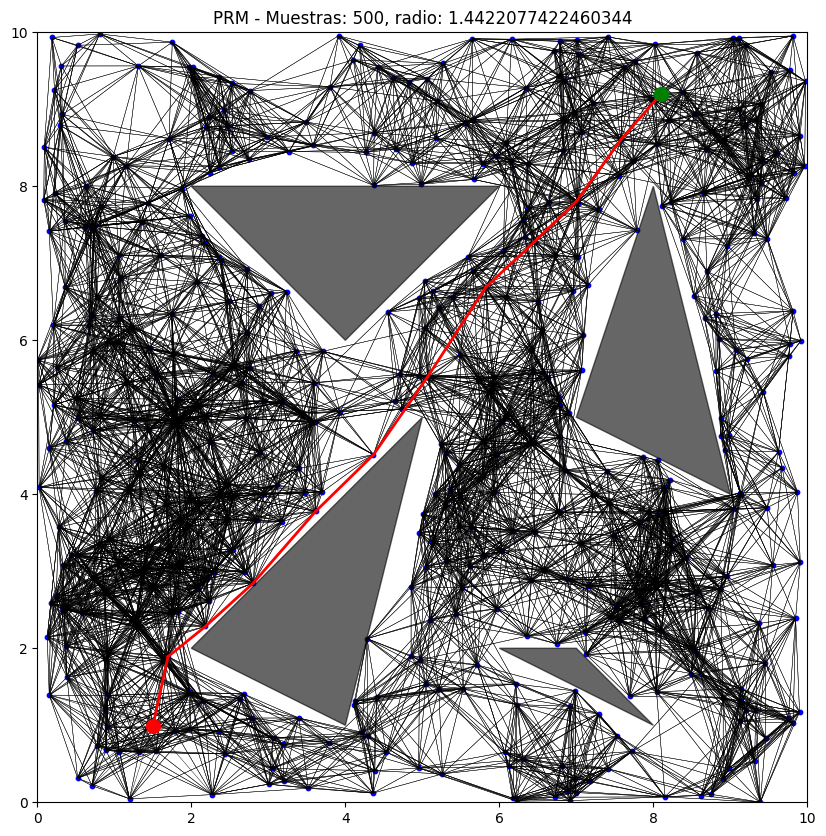

Costo del camino:  10.69081537844891
PRM* ---------------------------------------------------------------
Cantidad de muestras:  500
Cantidad de aristas:  13884
Radio de conexión:  1.4422077422460344
Longitud del camino más corto: 10.69081537844891


In [16]:
prm_star_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_star_instance.add_query_points(start, goal)

shortest_path = prm_star_instance.find_shortest_path(start, goal)
path_cost = prm_star_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_star_instance.plot_query_PRM(start, goal)

prm_star_instance.summary()

#### Generación de muestras - baja dispersión - Secuencia de Halton

In [17]:
def halton_sequence(N, b1=2, b2=3):
    points = np.zeros((N, 2))
    for n in range(N):
        points[n, 0] = radical_inverse(n, b1)
        points[n, 1] = radical_inverse(n, b2)
    return points

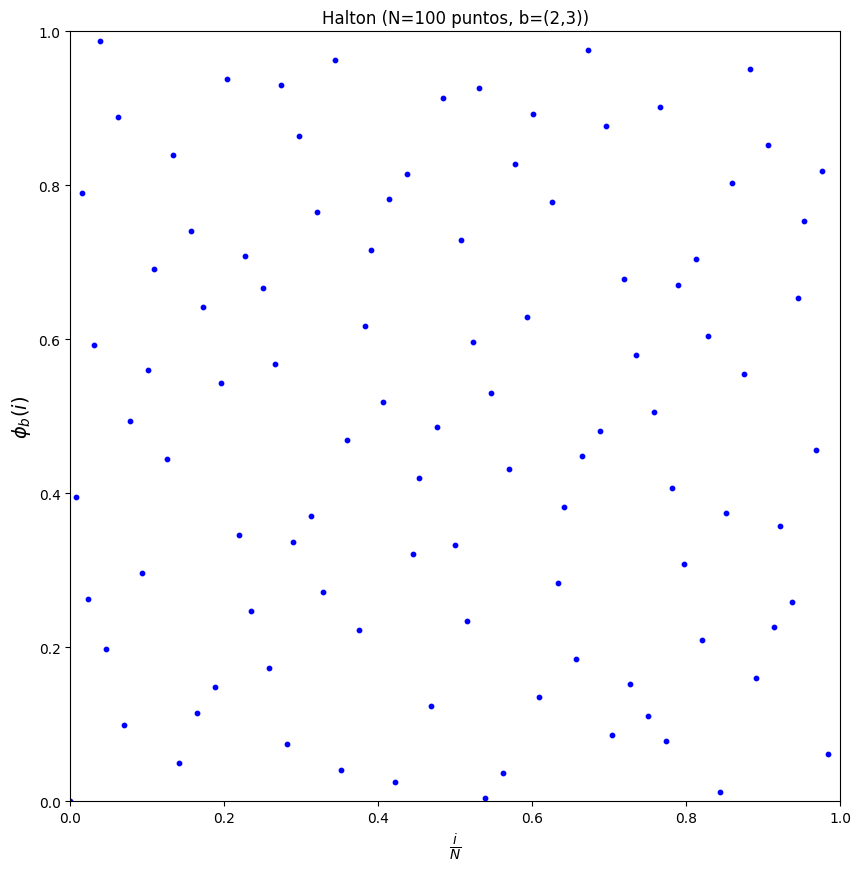

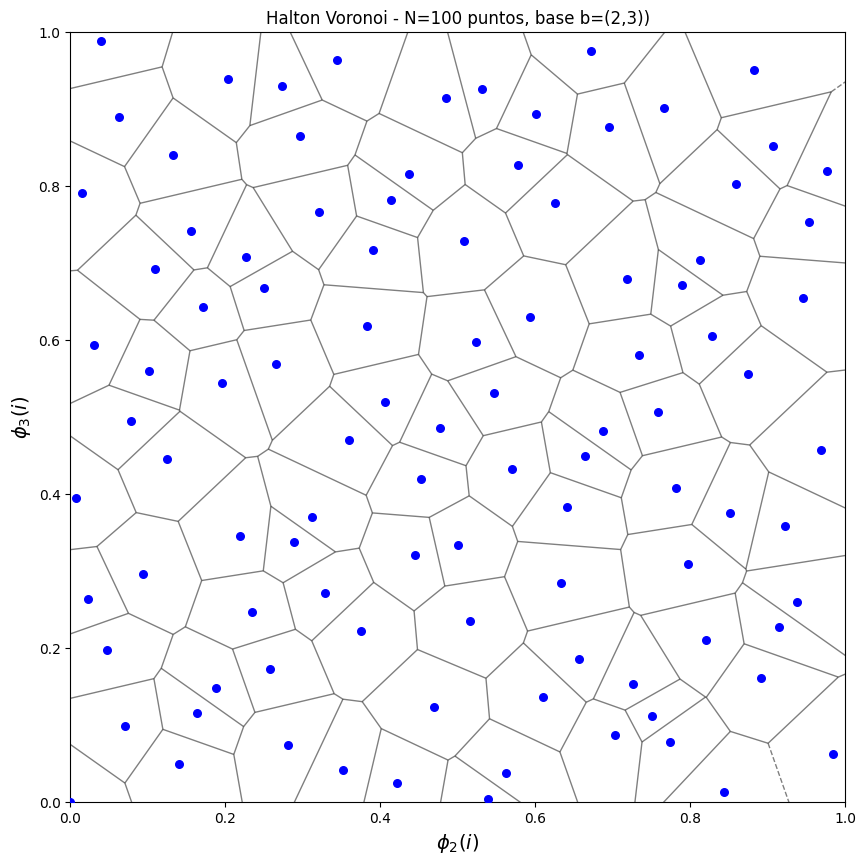

In [18]:
b1, b2 = 2, 3 # d coprimos
halton_points = halton_sequence(100, b1,b2)*10
plot_halton_voronoi(100)

#### Generación de muestras - baja dispersión - Secuencia de Hammersley

In [19]:
def hammersley_sequence(N, b=2):
    points = np.zeros((N, 2))
    for n in range(N):
        points[n, 0] = n / N
        points[n, 1] = radical_inverse(n, b)  # Van der Corput 2D
    return points

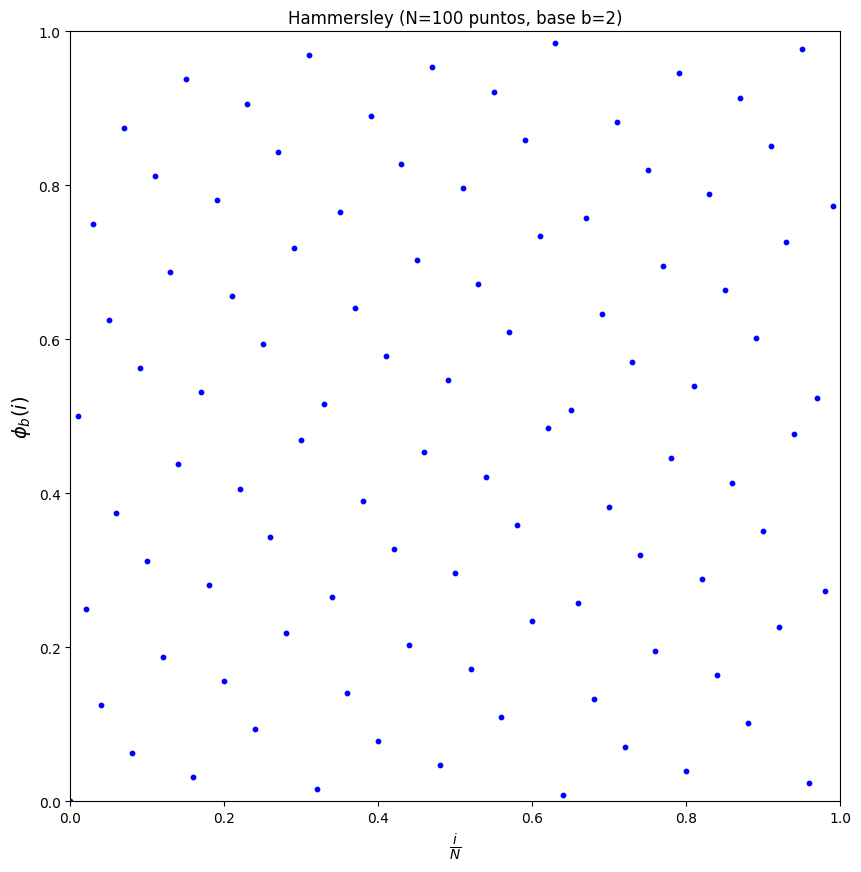

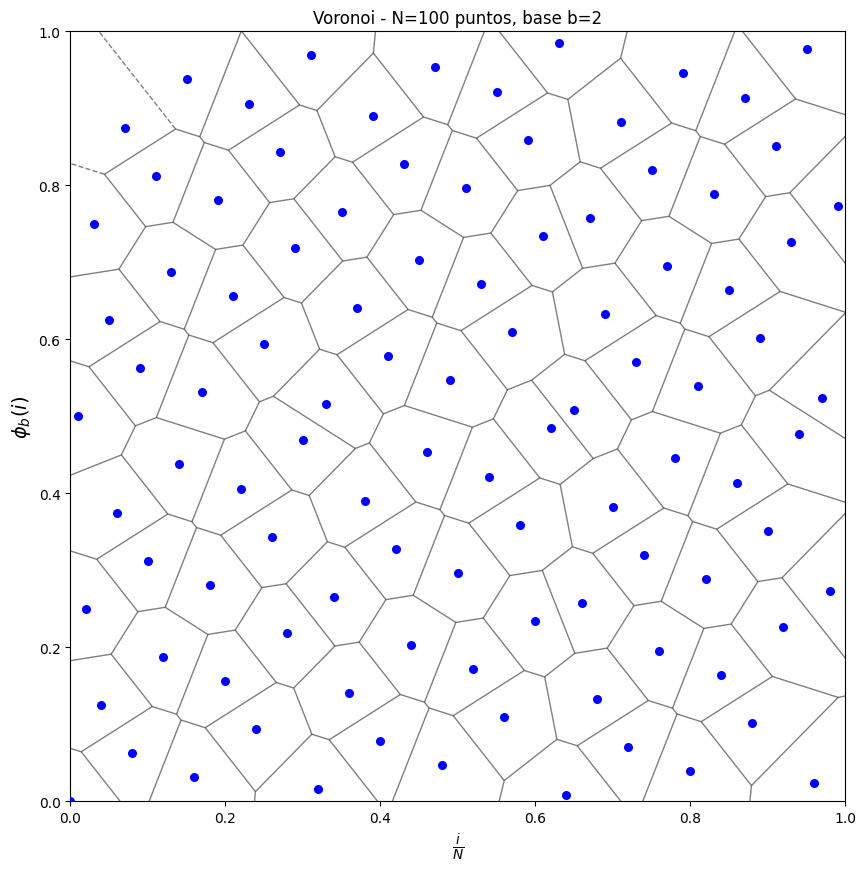

In [20]:
hammersley_points = hammersley_sequence(100, b1)*10
plot_hammersley_voronoi(100)

#### PRM con muestras de baja dispersion

In [21]:
halton_points = halton_sequence(100, b1)*10
filtered_halton = [[np.float64(x) for x in row] for row in filter_samples(halton_points, obstacles)]

prm_instance = PRM(filtered_halton, obstacles, radio)

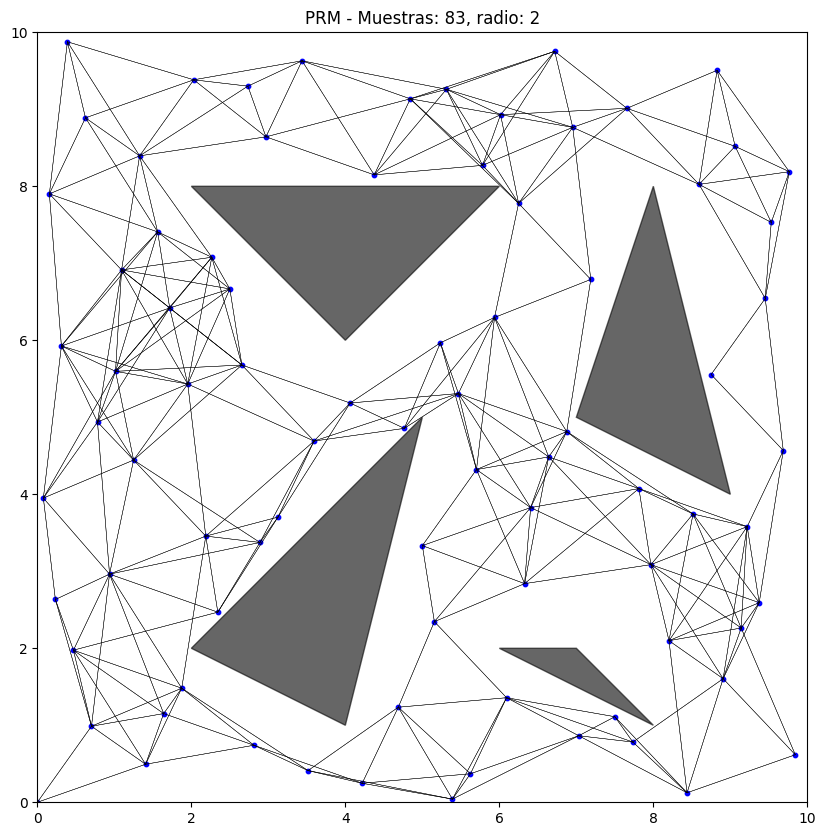

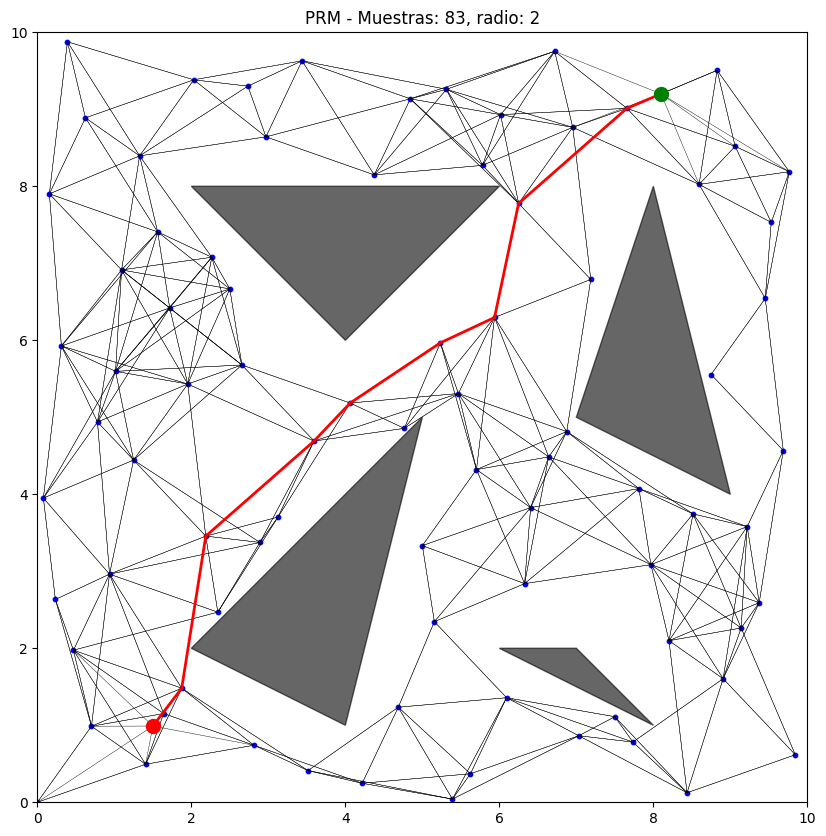

Costo del camino:  11.222557630248492
PRM ---------------------------------------------------------------
Cantidad de muestras:  83
Cantidad de aristas:  548
Radio de conexión:  2
Longitud del camino más corto: 11.222557630248492
-------------------------------------------------------------------


In [22]:
prm_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_instance.add_query_points(start, goal)

shortest_path = prm_instance.find_shortest_path(start, goal)
path_cost = prm_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_instance.plot_query_PRM(start, goal)

prm_instance.summary()

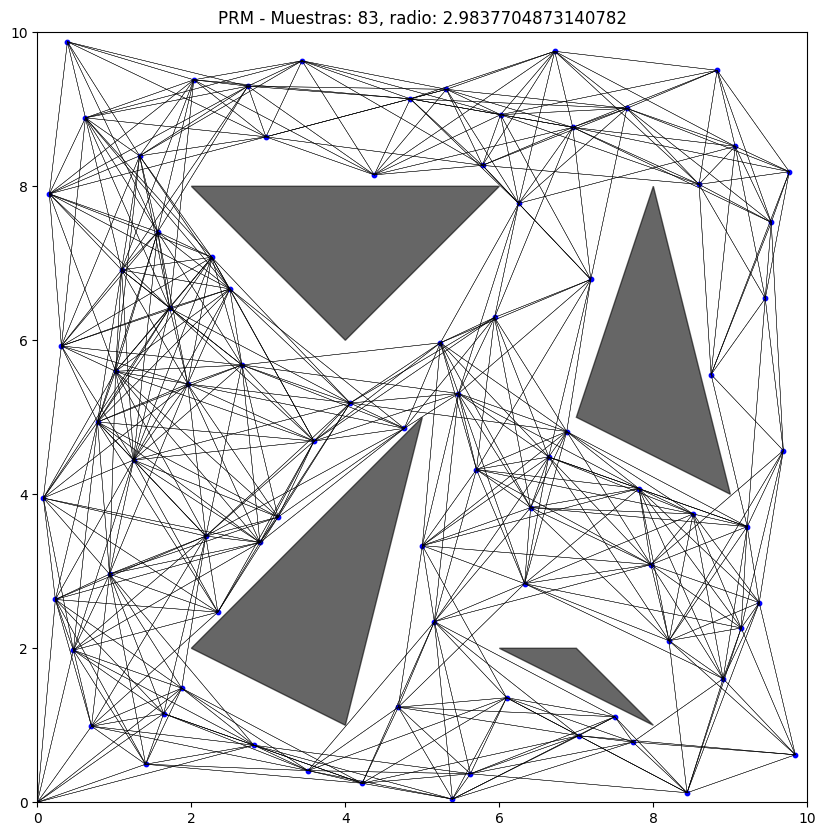

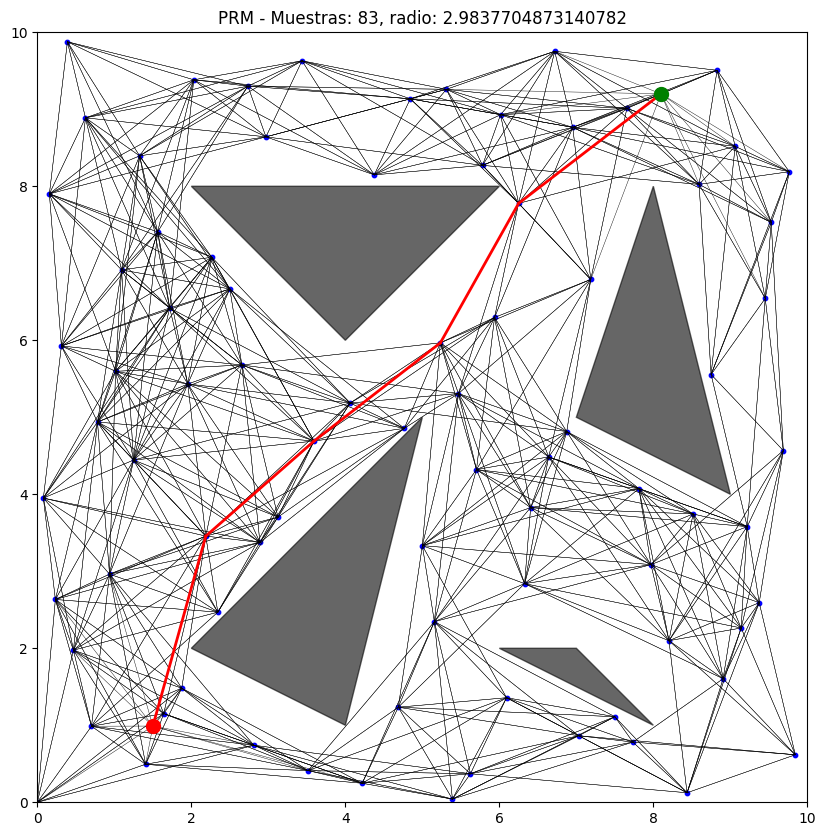

Costo del camino:  10.919915392490656
PRM* ---------------------------------------------------------------
Cantidad de muestras:  83
Cantidad de aristas:  1024
Radio de conexión:  2.9837704873140782
Longitud del camino más corto: 10.919915392490656


In [23]:
prm_star_instance = PRM_star(filtered_halton, obstacles)

prm_star_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_star_instance.add_query_points(start, goal)

shortest_path = prm_star_instance.find_shortest_path(start, goal)
path_cost = prm_star_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_star_instance.plot_query_PRM(start, goal)

prm_star_instance.summary()

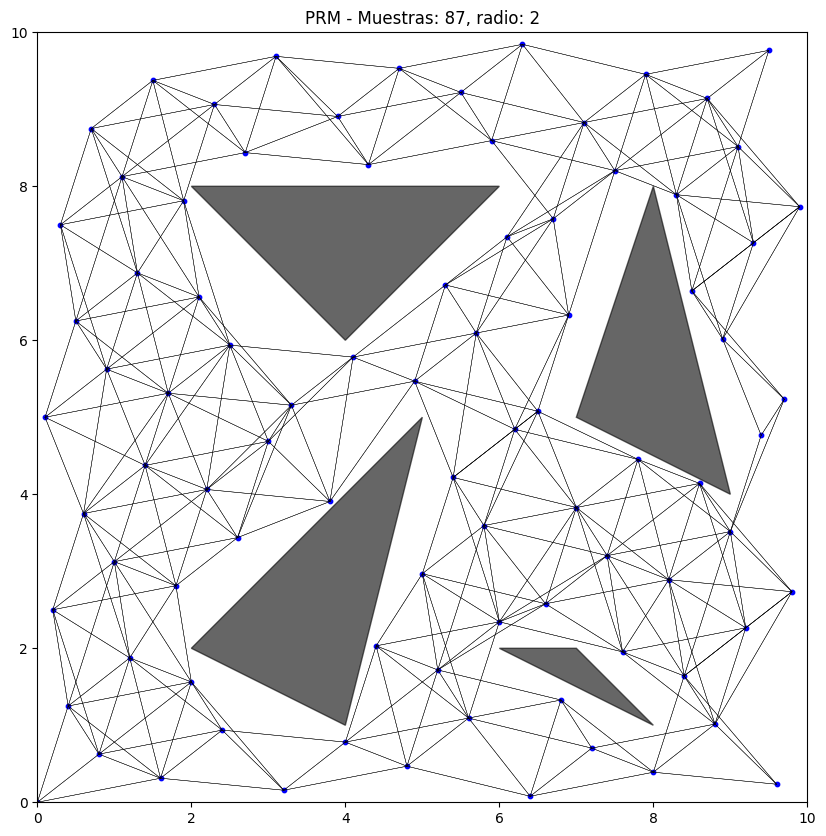

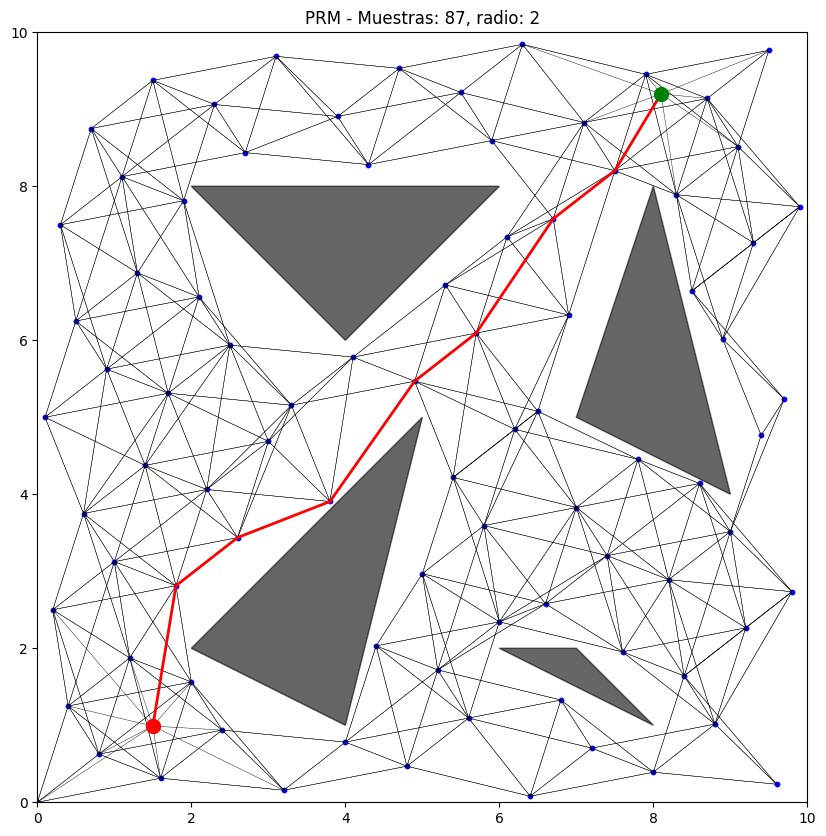

Costo del camino:  11.045094132494999
PRM ---------------------------------------------------------------
Cantidad de muestras:  87
Cantidad de aristas:  628
Radio de conexión:  2
Longitud del camino más corto: 11.045094132494999
-------------------------------------------------------------------


In [24]:
hammersley_points = hammersley_sequence(100, b1)*10
filtered_hammersley = [[np.float64(x) for x in row] for row in filter_samples(hammersley_points, obstacles)]

prm_instance = PRM(filtered_hammersley, obstacles, radio)

prm_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_instance.add_query_points(start, goal)

shortest_path = prm_instance.find_shortest_path(start, goal)
path_cost = prm_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_instance.plot_query_PRM(start, goal)

prm_instance.summary()

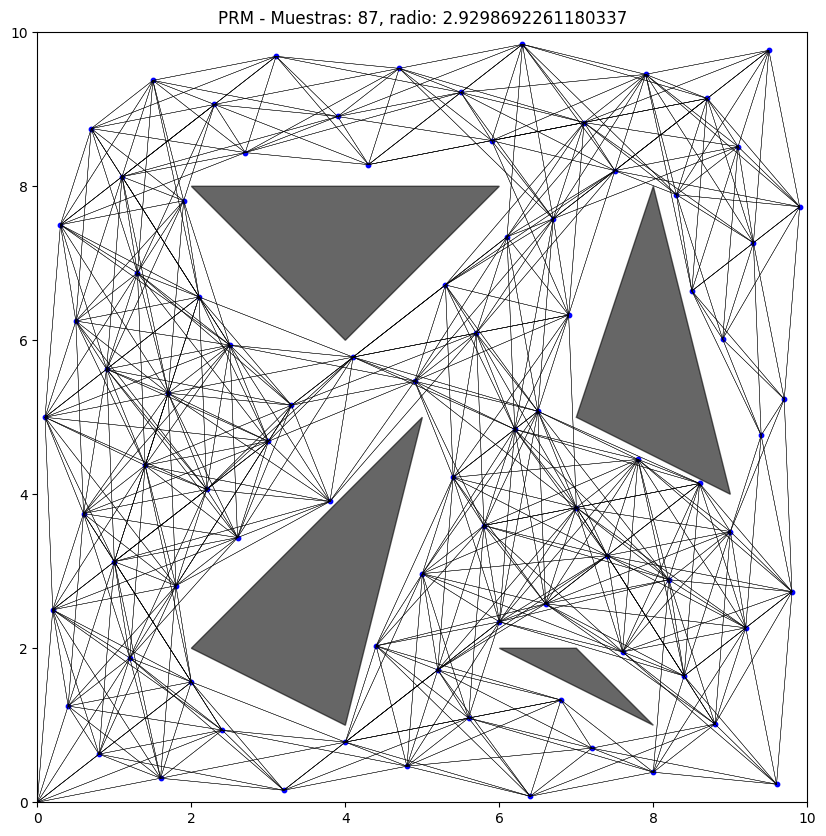

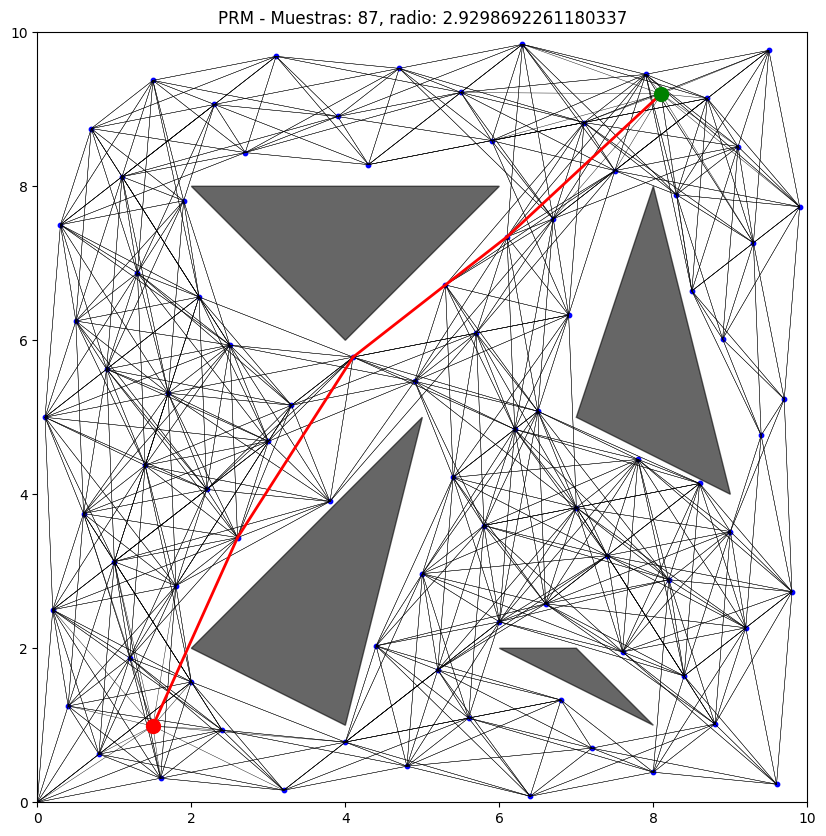

Costo del camino:  10.732650439804036
PRM* ---------------------------------------------------------------
Cantidad de muestras:  87
Cantidad de aristas:  1116
Radio de conexión:  2.9298692261180337
Longitud del camino más corto: 10.732650439804036


In [25]:
prm_star_instance = PRM_star(filtered_hammersley, obstacles)

prm_star_instance.plot_original_PRM()

qV, qE, start_idx, goal_idx = prm_star_instance.add_query_points(start, goal)

shortest_path = prm_star_instance.find_shortest_path(start, goal)
path_cost = prm_star_instance.min_path_cost(start, goal)

#print("Camino más corto:", shortest_path)
#print("Costo del camino más corto:", path_cost)

prm_star_instance.plot_query_PRM(start, goal)

prm_star_instance.summary()

#### Análisis

In [103]:
b1, b2 = 2, 3 # coprimos
sequence_samples = 100

halton_sample_counts = []
halton_filtered_counts = []
halton_dict = {}
hammersley_sample_counts = []
hammersley_filtered_counts = []
hammersley_dict = {}
random_sample_counts = []
random_filtered_counts = []

MAX_SAMPLES = 500 # aumentar el maximo de muestras es recomendado para observar más lejos en el análisis
while(sequence_samples < MAX_SAMPLES):
    # Halton
    halton_points = halton_sequence(sequence_samples, b1,b2)*10
    filtered_halton_points = filter_samples(halton_points, obstacles)
    #print(len(filtered_halton_points))

    # Hammersley
    hammersley_points = hammersley_sequence(sequence_samples, b=2)*10
    filtered_hammersley_points = filter_samples(hammersley_points, obstacles)
    #print(len(filtered_hammersley_points))

    #print('--------------')

    random_filtered_count = filter_samples(descartadas[:sequence_samples], obstacles)

    halton_sample_counts.append(sequence_samples)
    halton_filtered_counts.append(len(filtered_halton_points))
    halton_dict[len(filtered_halton_points)] = sequence_samples

    hammersley_sample_counts.append(sequence_samples)
    hammersley_filtered_counts.append(len(filtered_hammersley_points))
    hammersley_dict[len(filtered_hammersley_points)] = sequence_samples

    random_sample_counts.append(sequence_samples)
    random_filtered_counts.append(len(random_filtered_count))

    sequence_samples += 1 # el tamaño de este salto puede incrementarse

In [104]:
common_elements = set(halton_filtered_counts).intersection(set(hammersley_filtered_counts))
num_common_elements = len(common_elements)
common_elements_list = list(common_elements)
common_elements_list.sort()
print(len(common_elements_list))

249


In [29]:
# guardar datos si es necesario
filename = "samples_data.pkl"

to_save = {
    'halton_sample_counts': halton_sample_counts,
    'halton_filtered_counts': halton_filtered_counts,
    'halton_dict': halton_dict,
    'hammersley_sample_counts': hammersley_sample_counts,
    'hammersley_filtered_counts': hammersley_filtered_counts ,
    'hammersley_dict': hammersley_dict ,
    'random_sample_counts': random_sample_counts,
    'random_filtered_counts': random_filtered_counts,
    'common_elements_list': common_elements_list
}

with open(filename, 'wb') as f:
    pickle.dump(to_save, f)
files.download(filename)

60

In [110]:
max_samples_to_compare = common_elements_list[-1]
prm_instance = PRM_star(samples[:max_samples_to_compare + 10], obstacles)
fixed_radius = prm_instance.radio

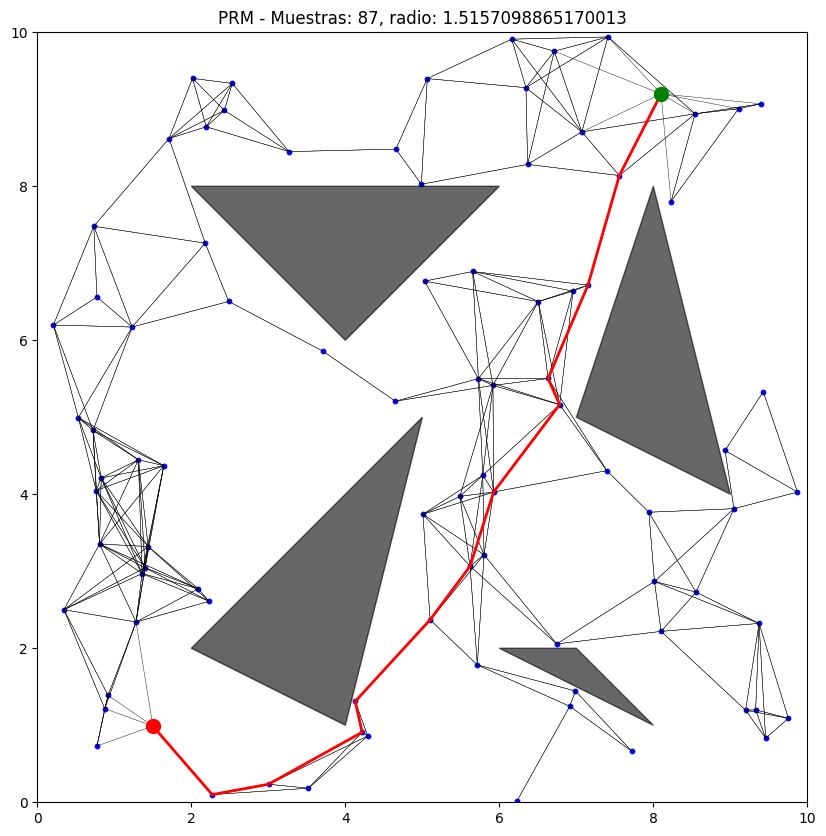

Costo del camino:  12.822501586584968
x_init =  [8.1 9.2]
x_goal =  [1.5  0.99]
PRM ---------------------------------------------------------------
Cantidad de muestras:  87
Cantidad de aristas:  464
Radio de conexión:  1.5157098865170013
Longitud del camino más corto: 12.822501586584968
-------------------------------------------------------------------


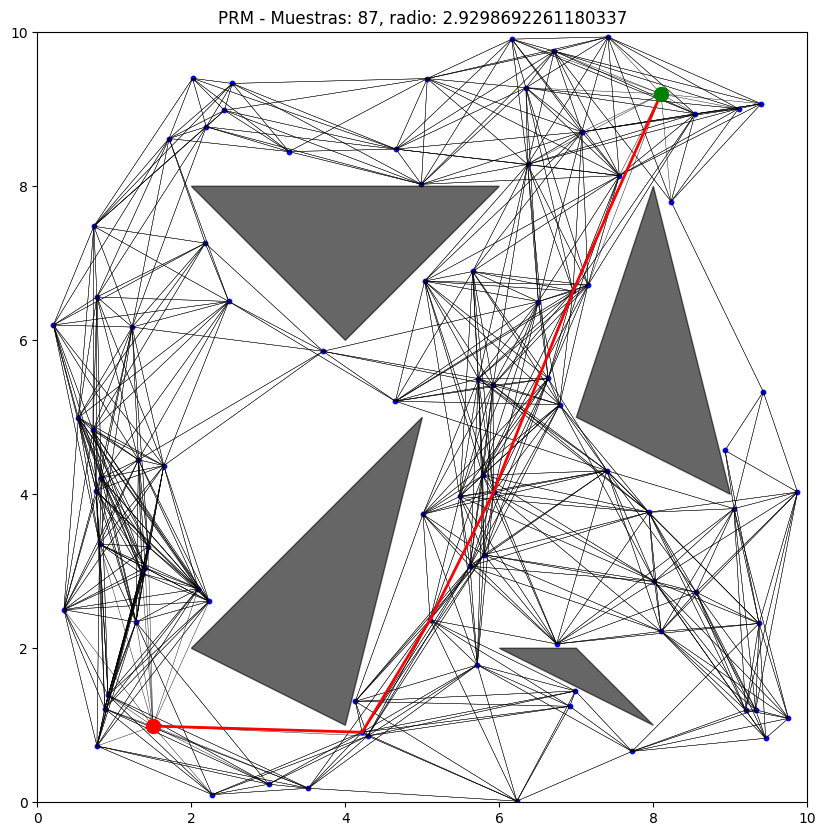

Costo del camino:  11.889299087146767
PRM* ---------------------------------------------------------------
Cantidad de muestras:  87
Cantidad de aristas:  1176
Radio de conexión:  2.9298692261180337
Longitud del camino más corto: 11.889299087146767


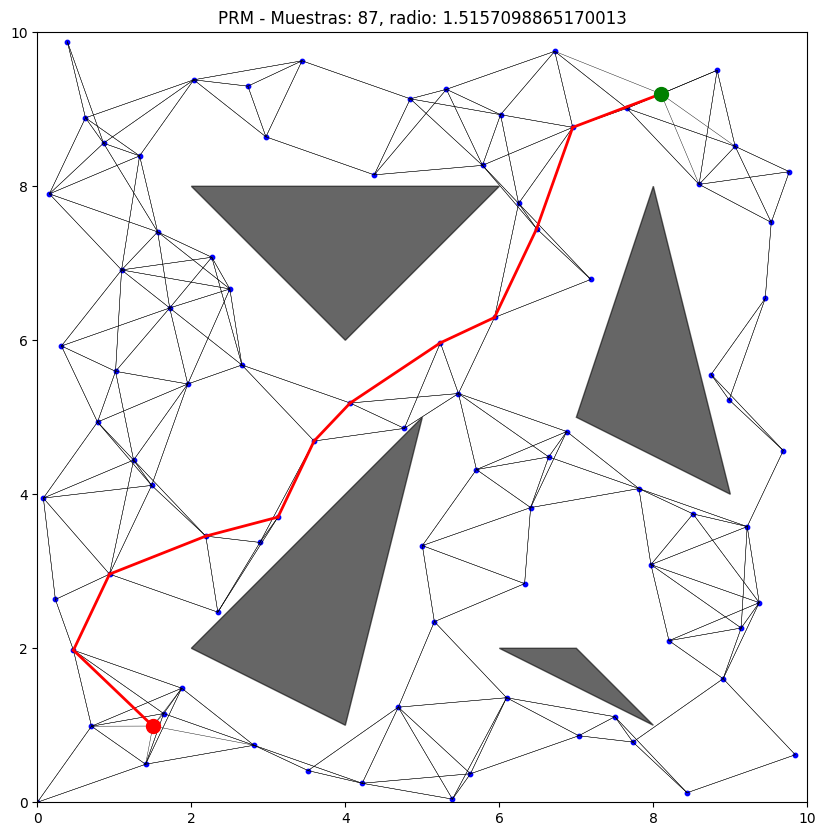

Costo del camino:  12.692012604981159
x_init =  [8.1 9.2]
x_goal =  [1.5  0.99]
PRM ---------------------------------------------------------------
Cantidad de muestras:  87
Cantidad de aristas:  420
Radio de conexión:  1.5157098865170013
Longitud del camino más corto: 12.692012604981159
-------------------------------------------------------------------


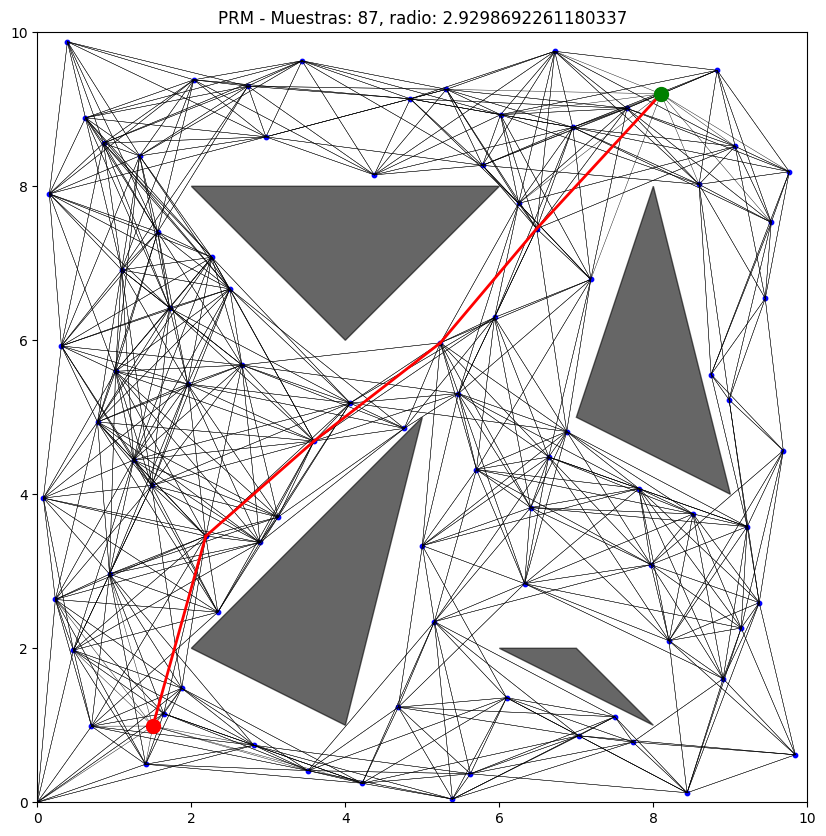

Costo del camino:  10.831515317080193
PRM* ---------------------------------------------------------------
Cantidad de muestras:  87
Cantidad de aristas:  1108
Radio de conexión:  2.9298692261180337
Longitud del camino más corto: 10.831515317080193


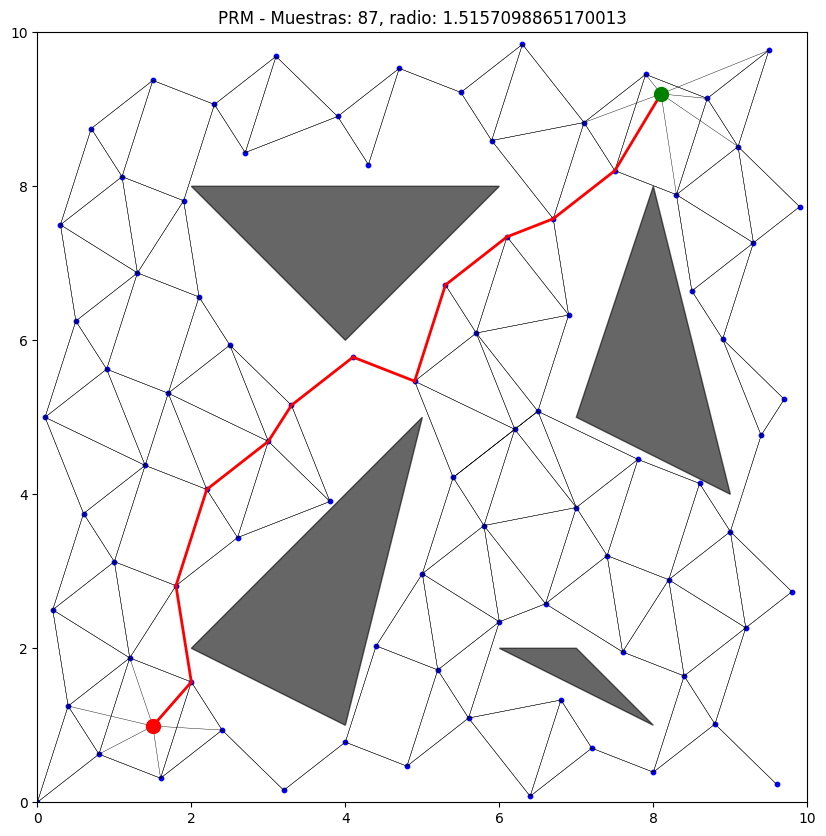

Costo del camino:  11.934734428483745
x_init =  [8.1 9.2]
x_goal =  [1.5  0.99]
PRM ---------------------------------------------------------------
Cantidad de muestras:  87
Cantidad de aristas:  350
Radio de conexión:  1.5157098865170013
Longitud del camino más corto: 11.934734428483745
-------------------------------------------------------------------


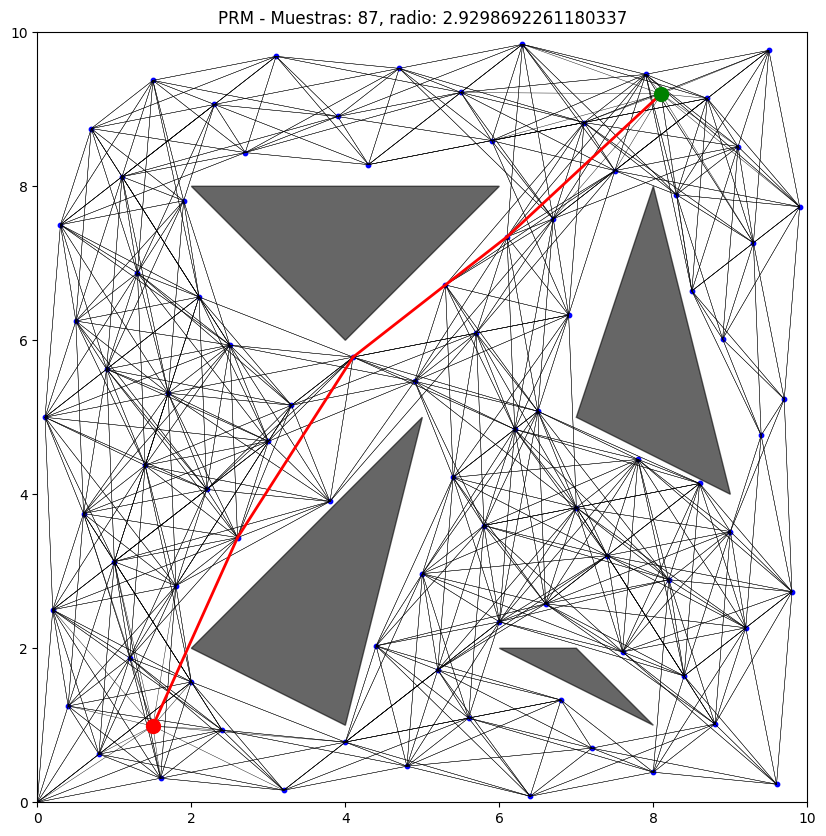

Costo del camino:  10.732650439804036
PRM* ---------------------------------------------------------------
Cantidad de muestras:  87
Cantidad de aristas:  1116
Radio de conexión:  2.9298692261180337
Longitud del camino más corto: 10.732650439804036
-----------------------------------------------------------------------
90
-----------------------------------------------------------------------
91
-----------------------------------------------------------------------
93
-----------------------------------------------------------------------
94
-----------------------------------------------------------------------
96
-----------------------------------------------------------------------
97
-----------------------------------------------------------------------
98
-----------------------------------------------------------------------
99
-----------------------------------------------------------------------
101
-----------------------------------------------------------------------
102

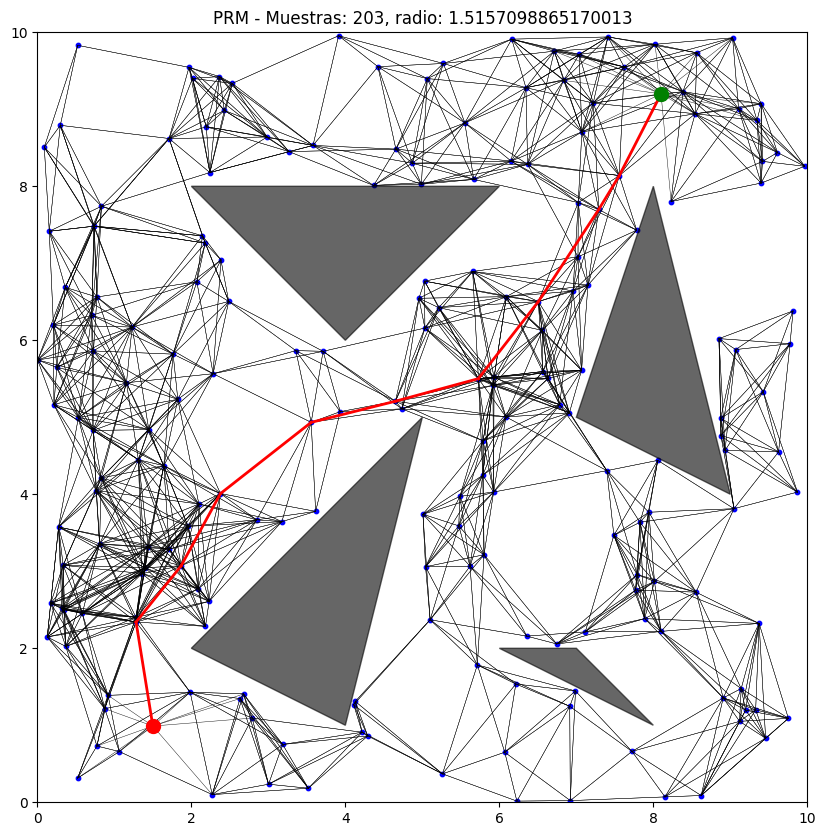

Costo del camino:  11.519529577575565
x_init =  [8.1 9.2]
x_goal =  [1.5  0.99]
PRM ---------------------------------------------------------------
Cantidad de muestras:  203
Cantidad de aristas:  2352
Radio de conexión:  1.5157098865170013
Longitud del camino más corto: 11.519529577575565
-------------------------------------------------------------------


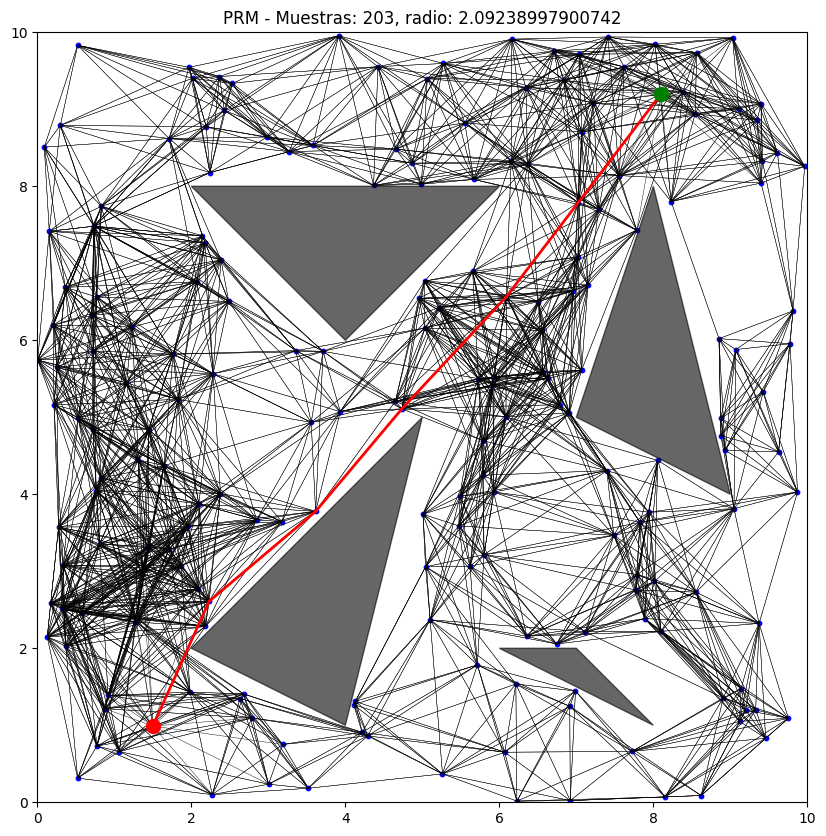

Costo del camino:  10.630833915452683
PRM* ---------------------------------------------------------------
Cantidad de muestras:  203
Cantidad de aristas:  4020
Radio de conexión:  2.09238997900742
Longitud del camino más corto: 10.630833915452683


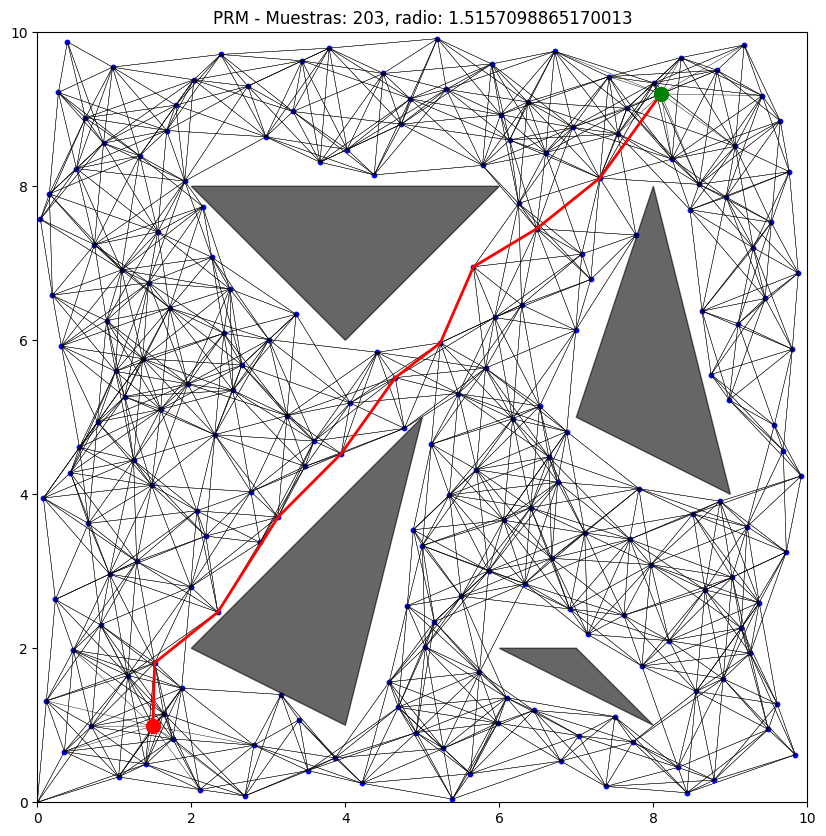

Costo del camino:  10.886916330563245
x_init =  [8.1 9.2]
x_goal =  [1.5  0.99]
PRM ---------------------------------------------------------------
Cantidad de muestras:  203
Cantidad de aristas:  2346
Radio de conexión:  1.5157098865170013
Longitud del camino más corto: 10.886916330563245
-------------------------------------------------------------------


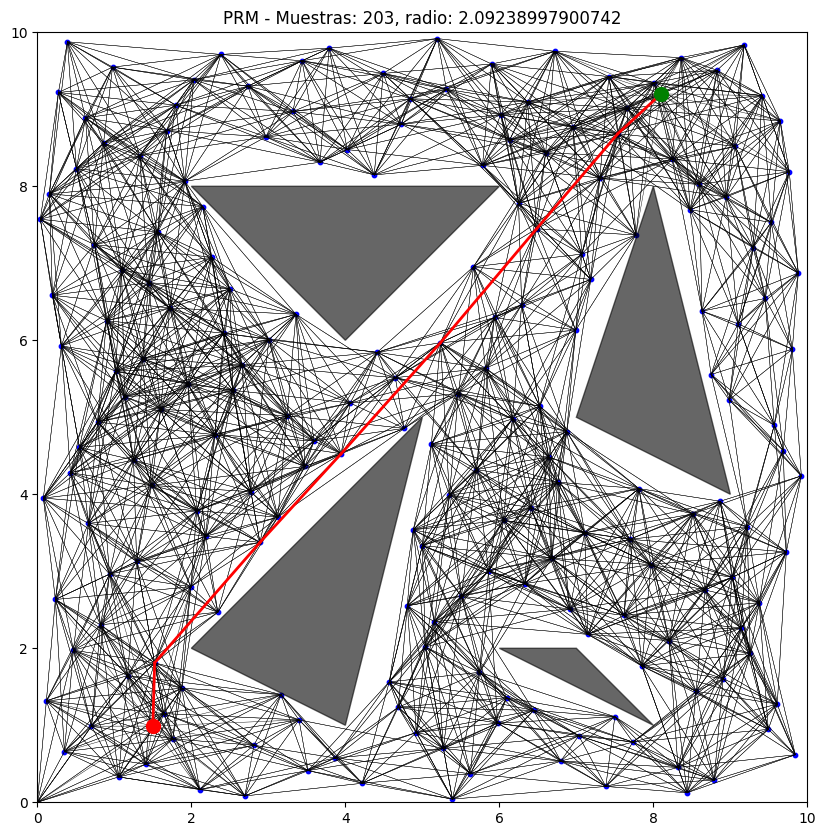

Costo del camino:  10.718083379992347
PRM* ---------------------------------------------------------------
Cantidad de muestras:  203
Cantidad de aristas:  3998
Radio de conexión:  2.09238997900742
Longitud del camino más corto: 10.718083379992347


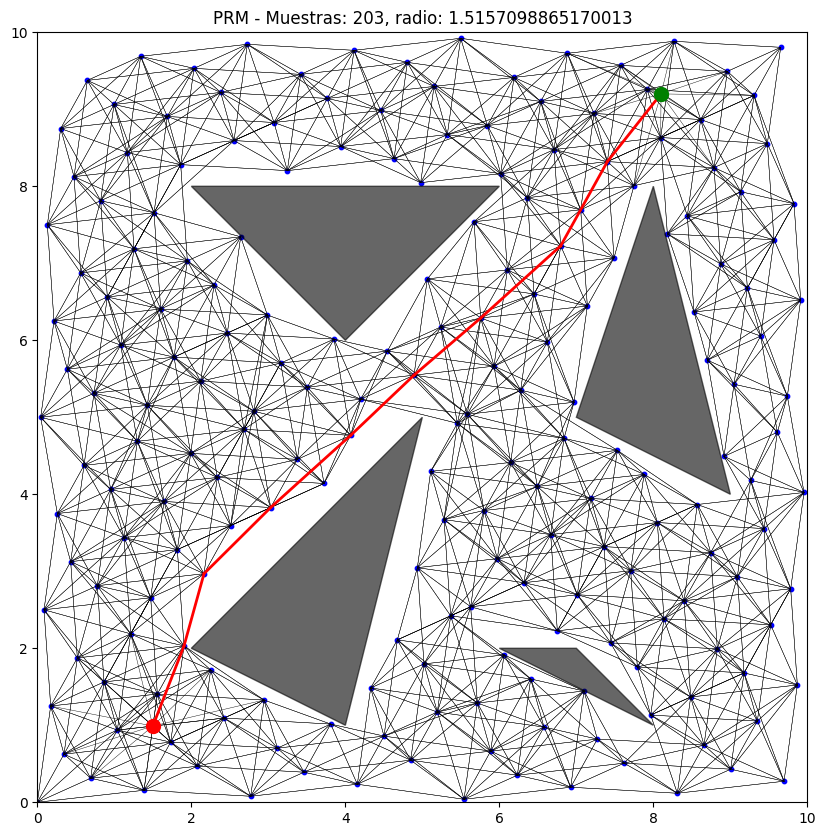

Costo del camino:  10.756495406888142
x_init =  [8.1 9.2]
x_goal =  [1.5  0.99]
PRM ---------------------------------------------------------------
Cantidad de muestras:  203
Cantidad de aristas:  2376
Radio de conexión:  1.5157098865170013
Longitud del camino más corto: 10.756495406888142
-------------------------------------------------------------------


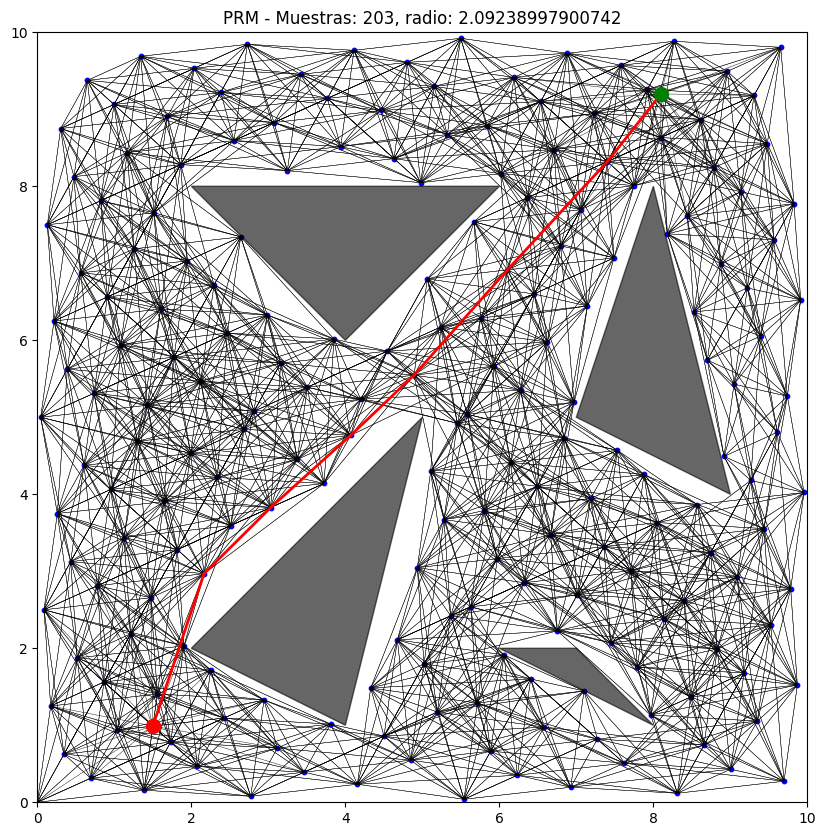

Costo del camino:  10.70498878286617
PRM* ---------------------------------------------------------------
Cantidad de muestras:  203
Cantidad de aristas:  3960
Radio de conexión:  2.09238997900742
Longitud del camino más corto: 10.70498878286617
-----------------------------------------------------------------------
204
-----------------------------------------------------------------------
207
-----------------------------------------------------------------------
209
-----------------------------------------------------------------------
210
-----------------------------------------------------------------------
211
-----------------------------------------------------------------------
214
-----------------------------------------------------------------------
216
-----------------------------------------------------------------------
217
-----------------------------------------------------------------------
218
----------------------------------------------------------------------

In [111]:
random_PRM_costs = []
random_PRM_estrella_costs = []
halton_PRM_costs = []
halton_PRM_estrella_costs = []
hammersley_PRM_costs = []
hammersley_PRM_estrella_costs = []

# para este numero de i se imprimen los caminos encontrados y summarys
checkpoints = [0, num_common_elements/3, num_common_elements/2, 3*num_common_elements/4 , num_common_elements]

for i in range(num_common_elements):
    numero_de_puntos_para_comparar = common_elements_list[i]
    if(i % 5):
        print('-----------------------------------------------------------------------')
        print(numero_de_puntos_para_comparar)

    # random

    # PRM
    random_samples = samples[:numero_de_puntos_para_comparar]

    PRM_instance = PRM(random_samples, obstacles, fixed_radius)
    start = np.array([8.1, 9.2])
    goal = np.array([1.5, 0.99])
    qV, qE, start_idx, goal_idx = PRM_instance.add_query_points(start, goal)
    random_PRM_costs.append(PRM_instance.min_path_cost(start, goal))

    if(i in checkpoints):
        PRM_instance.plot_query_PRM(start, goal)
        PRM_instance.summary()

    # PRM star
    PRM_star_instance = PRM_star(random_samples, obstacles)
    start = np.array([8.1, 9.2])
    goal = np.array([1.5, 0.99])
    qV, qE, start_idx, goal_idx = PRM_star_instance.add_query_points(start, goal)
    random_PRM_estrella_costs.append(PRM_star_instance.min_path_cost(start, goal))

    if(i in checkpoints):
        PRM_star_instance.plot_query_PRM(start, goal)
        PRM_star_instance.summary()

    # Halton
    n_halton_samples = halton_dict[numero_de_puntos_para_comparar]
    halton_points = halton_sequence(n_halton_samples, b1,b2)*10

    filtered_halton_points = [[np.float64(x) for x in row] for row in filter_samples(halton_points, obstacles)]

    # PRM
    PRM_instance = PRM(filtered_halton_points, obstacles, fixed_radius)
    start = np.array([8.1, 9.2])
    goal = np.array([1.5, 0.99])
    qV, qE, start_idx, goal_idx = PRM_instance.add_query_points(start, goal)
    halton_PRM_costs.append(PRM_instance.min_path_cost(start, goal))

    if(i in checkpoints):
        PRM_instance.plot_query_PRM(start, goal)
        PRM_instance.summary()

    # PRM star
    PRM_star_instance = PRM_star(filtered_halton_points, obstacles)
    start = np.array([8.1, 9.2])
    goal = np.array([1.5, 0.99])
    qV, qE, start_idx, goal = PRM_star_instance.add_query_points(start, goal)
    halton_PRM_estrella_costs.append(PRM_star_instance.min_path_cost(start, goal))

    if(i in checkpoints):
        start = np.array([8.1, 9.2])
        goal = np.array([1.5, 0.99])
        PRM_star_instance.plot_query_PRM(start, goal)
        PRM_star_instance.summary()

    # Hammersley
    n_hammersley_samples = hammersley_dict[numero_de_puntos_para_comparar]
    hammersley_points = hammersley_sequence(n_hammersley_samples, b=2)*10

    filtered_hammersley_points = [[np.float64(x) for x in row] for row in  filter_samples(hammersley_points, obstacles)]

    # PRM
    PRM_instance = PRM(filtered_hammersley_points, obstacles, fixed_radius)
    start = np.array([8.1, 9.2])
    goal = np.array([1.5, 0.99])
    qV, qE, start_idx, goal_idx = PRM_instance.add_query_points(start, goal)
    hammersley_PRM_costs.append(PRM_instance.min_path_cost(start, goal))

    if(i in checkpoints):
        PRM_instance.plot_query_PRM(start, goal)
        PRM_instance.summary()

    # PRM star
    PRM_star_instance = PRM_star(filtered_hammersley_points, obstacles)
    start = np.array([8.1, 9.2])
    goal = np.array([1.5, 0.99])
    qV, qE, start_idx, goal_idx = PRM_star_instance.add_query_points(start, goal)
    hammersley_PRM_estrella_costs.append(PRM_star_instance.min_path_cost(start, goal))

    if(i in checkpoints):
        PRM_star_instance.plot_query_PRM(start, goal)
        PRM_star_instance.summary()

In [ ]:
# guardar datos si es necesario
costs_filename = "experiment_costs.pkl"

to_save = {
    'random_PRM_costs': random_PRM_costs,
    'random_PRM_estrella_costs': random_PRM_estrella_costs,
    'halton_PRM_costs': halton_PRM_costs,
    'halton_PRM_estrella_costs': halton_PRM_estrella_costs,
    'hammersley_PRM_costs': hammersley_PRM_costs,
    'hammersley_PRM_estrella_costs': hammersley_PRM_estrella_costs
}

with open(costs_filename, 'wb') as f:
    pickle.dump(to_save, f)


files.download(costs_filename)

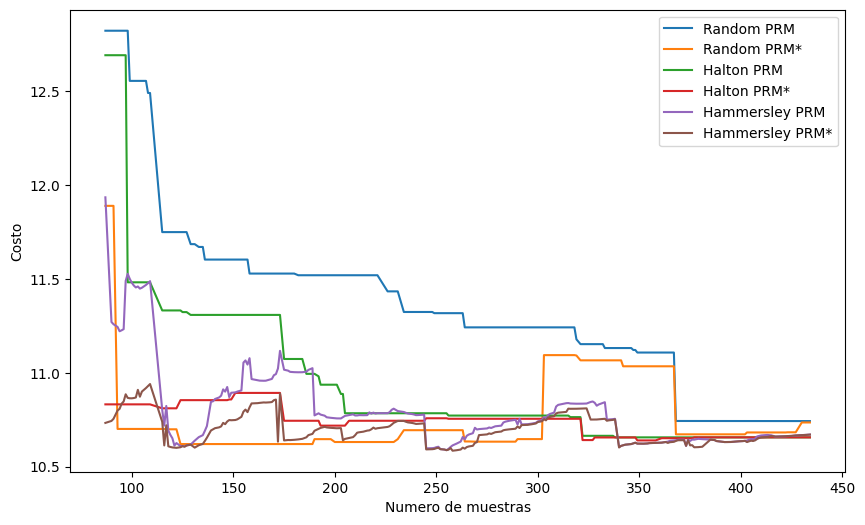

In [113]:
plt.figure(figsize=(10, 6))

plt.plot(common_elements_list[:len(random_PRM_costs)], random_PRM_costs, label='Random PRM')
plt.plot(common_elements_list[:len(random_PRM_estrella_costs)], random_PRM_estrella_costs, label='Random PRM*')
plt.plot(common_elements_list[:len(halton_PRM_costs)], halton_PRM_costs, label='Halton PRM')
plt.plot(common_elements_list[:len(halton_PRM_estrella_costs)], halton_PRM_estrella_costs, label='Halton PRM*')
plt.plot(common_elements_list[:len(hammersley_PRM_costs)], hammersley_PRM_costs, label='Hammersley PRM')
plt.plot(common_elements_list[:len(hammersley_PRM_estrella_costs)], hammersley_PRM_estrella_costs, label='Hammersley PRM*')

plt.xlabel('Numero de muestras')
plt.ylabel('Costo')
plt.legend()
plt.show()

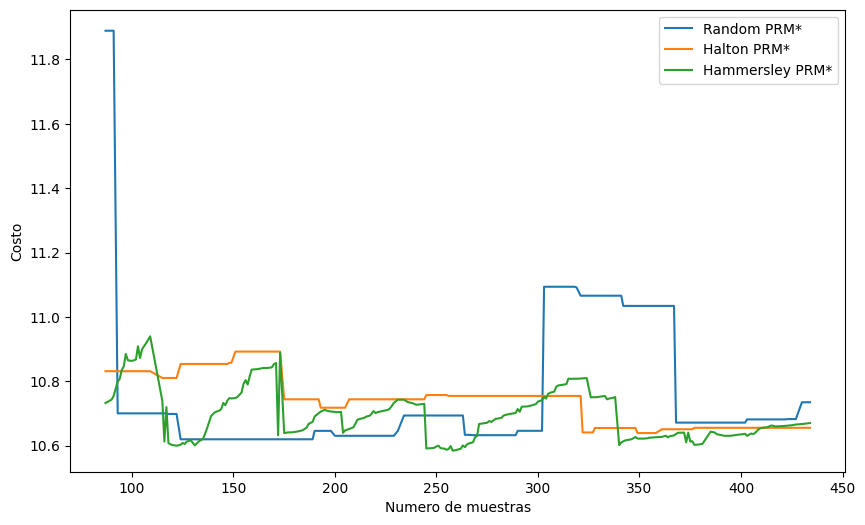

In [114]:
plt.figure(figsize=(10, 6))

plt.plot(common_elements_list[:len(random_PRM_estrella_costs)], random_PRM_estrella_costs, label='Random PRM*')
plt.plot(common_elements_list[:len(halton_PRM_estrella_costs)], halton_PRM_estrella_costs, label='Halton PRM*')
plt.plot(common_elements_list[:len(hammersley_PRM_estrella_costs)], hammersley_PRM_estrella_costs, label='Hammersley PRM*')

plt.xlabel('Numero de muestras')
plt.ylabel('Costo')
plt.legend()
plt.show()

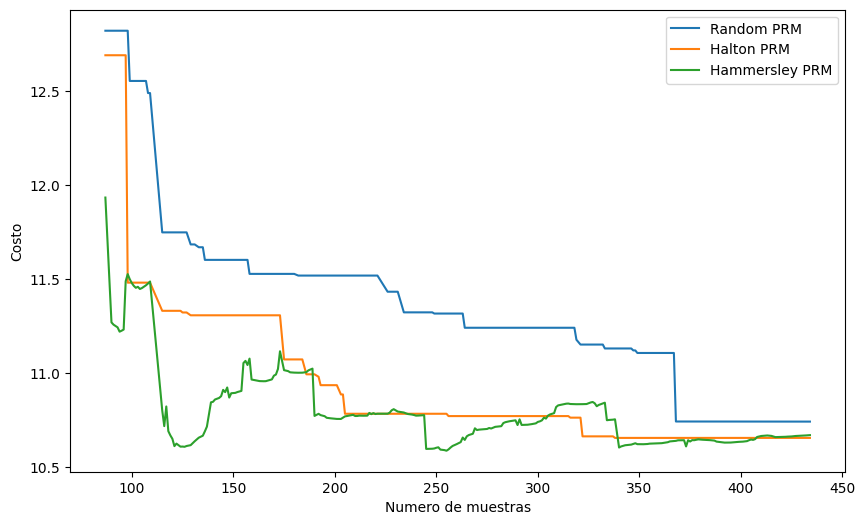

In [115]:
plt.figure(figsize=(10, 6))

plt.plot(common_elements_list[:len(random_PRM_costs)], random_PRM_costs, label='Random PRM')
plt.plot(common_elements_list[:len(halton_PRM_costs)], halton_PRM_costs, label='Halton PRM')
plt.plot(common_elements_list[:len(hammersley_PRM_costs)], hammersley_PRM_costs, label='Hammersley PRM')

plt.xlabel('Numero de muestras')
plt.ylabel('Costo')
plt.legend()
plt.show()

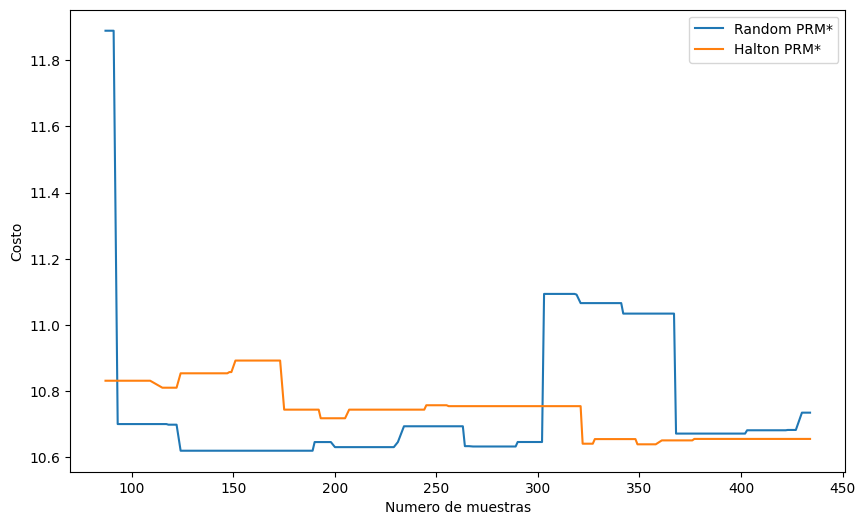

In [116]:
plt.figure(figsize=(10, 6))

plt.plot(common_elements_list[:len(random_PRM_estrella_costs)], random_PRM_estrella_costs, label='Random PRM*')
plt.plot(common_elements_list[:len(halton_PRM_estrella_costs)], halton_PRM_estrella_costs, label='Halton PRM*')

plt.xlabel('Numero de muestras')
plt.ylabel('Costo')
plt.legend()
plt.show()

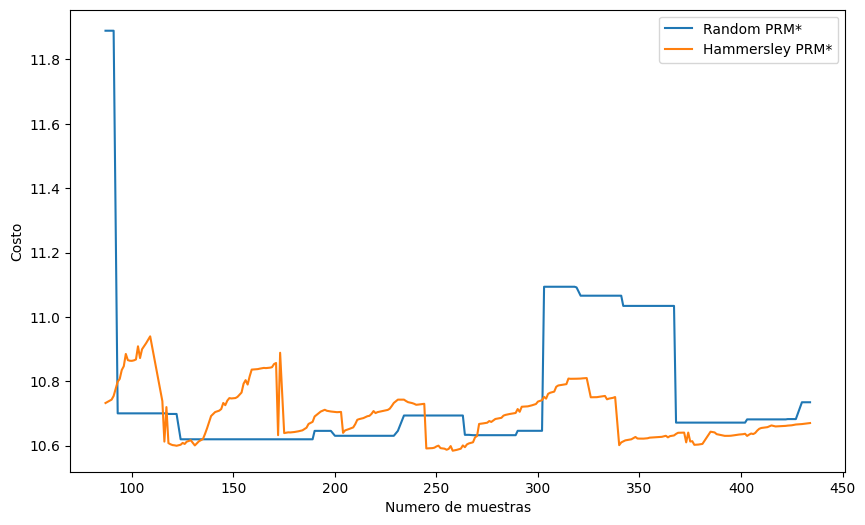

In [117]:
plt.figure(figsize=(10, 6))

plt.plot(common_elements_list[:len(random_PRM_estrella_costs)], random_PRM_estrella_costs, label='Random PRM*')
plt.plot(common_elements_list[:len(hammersley_PRM_estrella_costs)], hammersley_PRM_estrella_costs, label='Hammersley PRM*')

plt.xlabel('Numero de muestras')
plt.ylabel('Costo')
plt.legend()
plt.show()

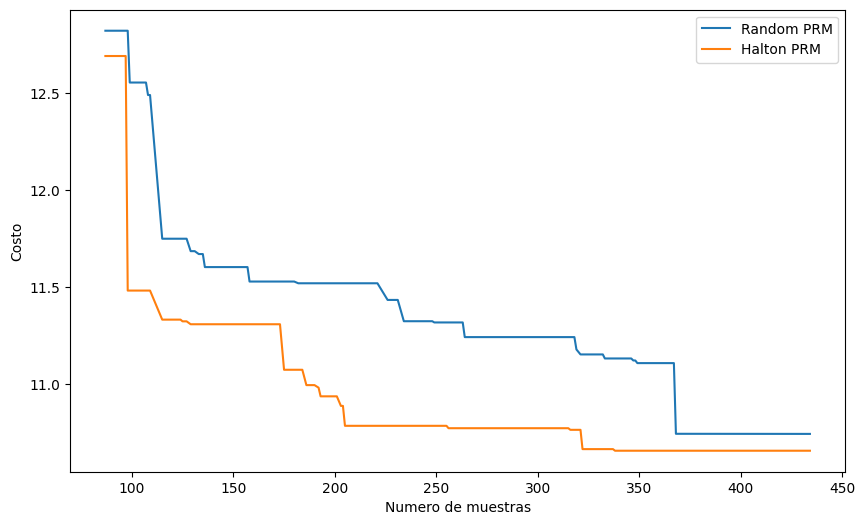

In [118]:
plt.figure(figsize=(10, 6))

plt.plot(common_elements_list[:len(random_PRM_costs)], random_PRM_costs, label='Random PRM')
plt.plot(common_elements_list[:len(halton_PRM_costs)], halton_PRM_costs, label='Halton PRM')

plt.xlabel('Numero de muestras')
plt.ylabel('Costo')
plt.legend()
plt.show()

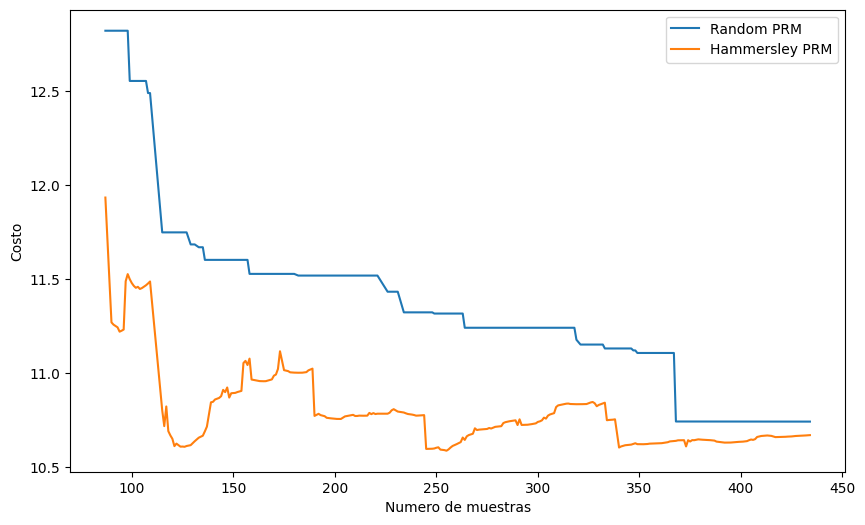

In [119]:
plt.figure(figsize=(10, 6))

plt.plot(common_elements_list[:len(random_PRM_costs)], random_PRM_costs, label='Random PRM')
plt.plot(common_elements_list[:len(hammersley_PRM_costs)], hammersley_PRM_costs, label='Hammersley PRM')

plt.xlabel('Numero de muestras')
plt.ylabel('Costo')
plt.legend()
plt.show()